# **PPO(Pxoimal Policy Optimization) Stock Trading Agent for XNAS.ITCH dataset**

## **1. Introduction**

### **1) Overview of this project**

This project is handled the buy/sell/hold trading decision in stock trading using historical order logs in the XNAS.ITCH dataset. There are so many approaches to solve this problem but I am going to solve this problem using reinforcement learning method with transformer.

### **2) Objectives of this report**

This is for trial task, so I am going to focus on creating whole pipeline of this machine learning project with


*   model implementation using torch
*   fine-tuning assocaited with the model architecture and learning hyperparameter
*   Evaluation of the model's performance
*   Comparison with blotter

Also, I will integrate my own ways to approch this problem in several detailed processes.

*※ In this report, I bold the new part what I did.*

## **2. Setup the Environment**

At first, we need to install talib python library. It isn't installed in a normal way, so I will manually build an install this library from the source.

In [1]:
!wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
!tar -xzvf ta-lib-0.4.0-src.tar.gz
%cd ta-lib
!./configure --prefix=/usr
!make
!make install
!pip install Ta-Lib
import talib

--2024-08-11 04:26:37--  http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
Resolving prdownloads.sourceforge.net (prdownloads.sourceforge.net)... 204.68.111.105
Connecting to prdownloads.sourceforge.net (prdownloads.sourceforge.net)|204.68.111.105|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz [following]
--2024-08-11 04:26:37--  http://downloads.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz
Resolving downloads.sourceforge.net (downloads.sourceforge.net)... 204.68.111.105
Reusing existing connection to prdownloads.sourceforge.net:80.
HTTP request sent, awaiting response... 302 Found
Location: http://pilotfiber.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz?viasf=1 [following]
--2024-08-11 04:26:37--  http://pilotfiber.dl.sourceforge.net/project/ta-lib/ta-lib/0.4.0/ta-lib-0.4.0-src.tar.gz?viasf=1
Res

And we need to install gymnasium and stable_baseline3 for reinforcement learning.

In [2]:
!pip install gymnasium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 953.9/953.9 kB 5.2 MB/s eta 0:00:00


In [21]:
!pip install stable_baselines3

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

## **3. Prepare data for machine learning**

As the saying goes: garbage in, garbage out. Our system will be trained well if the training data contains enough relevant features.  
Truth be told, this is the critical part to succeed a machine learning project.

### **1)Data Loading and Feature Engineering**

Before load the dataset from the csv file, this project created a class to add the new features associated with this trading.

In [96]:
import pandas as pd
import numpy as np
import talib as ta

class TechnicalIndicators:
    def __init__(self, data):
        self.data = data

    def add_momentum_indicators(self):
        self.data['RSI'] = ta.RSI(self.data['Close'], timeperiod=14)
        self.data['MACD'], self.data['MACD_signal'], self.data['MACD_hist'] = ta.MACD(self.data['Close'], fastperiod=12, slowperiod=26, signalperiod=9)
        self.data['Stoch_k'], self.data['Stoch_d'] = ta.STOCH(self.data['High'], self.data['Low'], self.data['Close'],
                                                              fastk_period=14, slowk_period=3, slowd_period=3)

    def add_volume_indicators(self):
        self.data['OBV'] = ta.OBV(self.data['Close'], self.data['Volume'])

    def add_volatility_indicators(self):
        self.data['Upper_BB'], self.data['Middle_BB'], self.data['Lower_BB'] = ta.BBANDS(self.data['Close'], timeperiod=20)
        self.data['ATR_1'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=1)
        self.data['ATR_2'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=2)
        self.data['ATR_5'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=5)
        self.data['ATR_10'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=10)
        self.data['ATR_20'] = ta.ATR(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=20)

    def add_trend_indicators(self):
        self.data['ADX'] = ta.ADX(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=14)
        self.data['+DI'] = ta.PLUS_DI(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=14)
        self.data['-DI'] = ta.MINUS_DI(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=14)
        self.data['CCI'] = ta.CCI(self.data['High'], self.data['Low'], self.data['Close'], timeperiod=5)

    def add_other_indicators(self):
        self.data['DLR'] = np.log(self.data['Close'] / self.data['Close'].shift(1))
        self.data['TWAP'] = self.data['Close'].expanding().mean()
        self.data['VWAP'] = (self.data['Volume'] * (self.data['High'] + self.data['Low']) / 2).cumsum() / self.data['Volume'].cumsum()

    def add_all_indicators(self):
        self.add_momentum_indicators()
        self.add_volume_indicators()
        self.add_volatility_indicators()
        self.add_trend_indicators()
        self.add_other_indicators()
        return self.data

Then, let's load data from the dataset.

In [103]:
data = pd.read_csv('/content/xnas-itch-20230703.tbbo.csv')

After loading data, this project scale the features associated with price(I think this process is converting the price unit from nanodollar to dollar.) and add more features for this task.

In [104]:
data['price']=data['price']/1e9
data['bid_px_00']=data['bid_px_00']/1e9
data['ask_px_00']=data['ask_px_00']/1e9

data['Close'] = data['price']
data['Volume'] = data['size']
data['High'] = data[['bid_px_00', 'ask_px_00']].max(axis=1)
data['Low'] = data[['bid_px_00', 'ask_px_00']].min(axis=1)
data['Open'] = data['Close'].shift(1).fillna(data['Close'])
data['ts_recv'] = pd.to_datetime(data['ts_recv'], unit='ns')
data['ts_event'] = pd.to_datetime(data['ts_event'], unit='ns')

**And I added new temporal features(hour of the day, day of the week) using ts_recv and ts_event. It's better to remove ts_recv and ts_event features from the dataset but those are remained in my script because of the usage in the agent construction process.**

In [105]:
data['recv_hour'] = data['ts_recv'].dt.hour
data['recv_day'] = data['ts_recv'].dt.dayofweek
data['event_hour'] = data['ts_event'].dt.hour
data['event_day'] = data['ts_event'].dt.dayofweek

**And I chaged some workflows to get the technical indicator feature values. Let me explain why I changed this part.**

From the following image in the original script, we can see that this script assumes that there can be several tickers in the dataset. I think this is good idea in the scalability of this script.

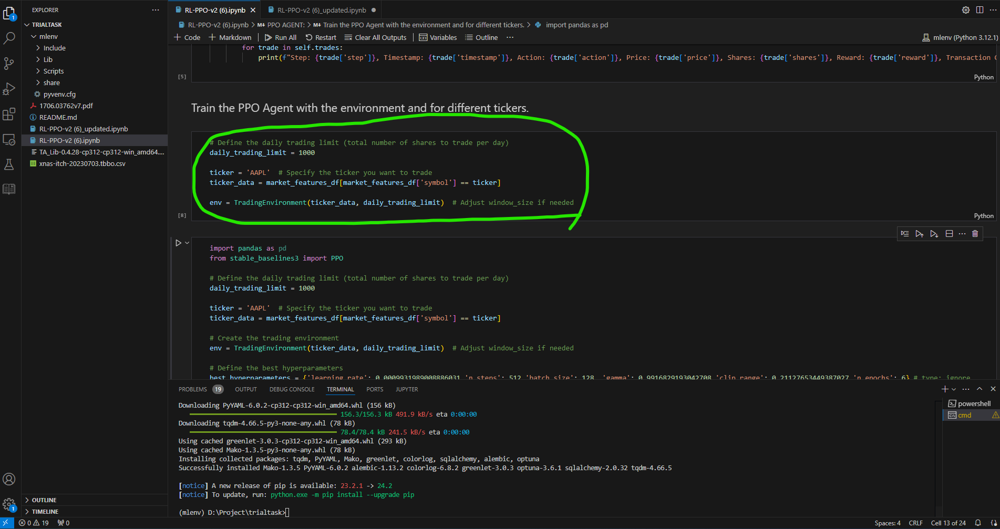

If then, it's logical that the calculation of the technical indicators is implemented after data filtering process of specific ticker in the dataset. But as you can see the following image in the original script, this process isn't working like this.

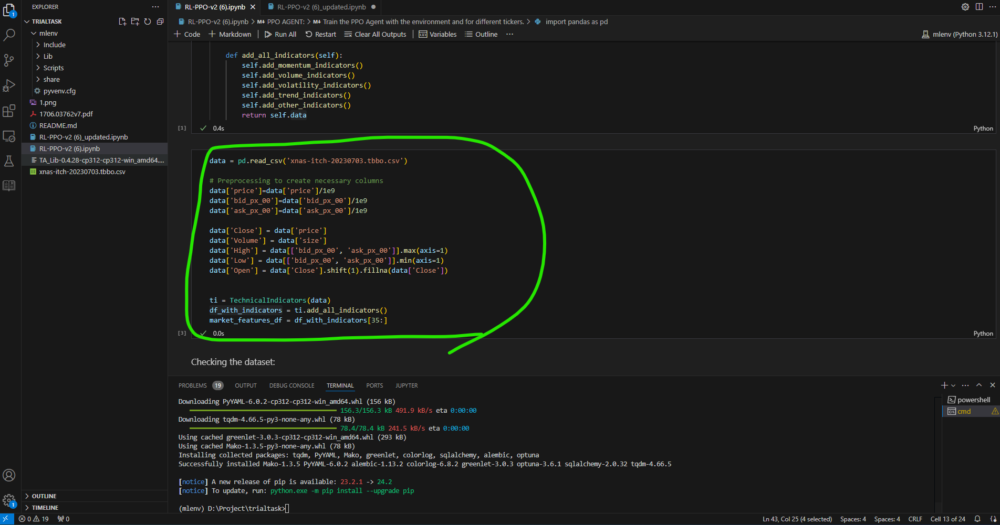

Luckily, there is no problem in this project because this dataset has only one ticker value("AAPL"). But, we need to update this part in a right way. Maybe, the technical indicator calculation in the dataset that has got several ticker values isn't working well in the original script. For scalability, I will updat this part as following:

In [106]:
ticker = "AAPL"

ticker_data = data[data["symbol"] == ticker]

***※Note that the Volume_for_Reward and Close_for_Reward features are added because those two values are used for reward calculation of the reward value of the agent. Also, I dropped the rows that have got NaN values for training.***

In [107]:
ti = TechnicalIndicators(ticker_data)
ticker_data_with_indicators = ti.add_all_indicators()
ticker_data_with_indicators["Volume_for_Reward"] = ticker_data_with_indicators["Volume"]
ticker_data_with_indicators["Close_for_Reward"] = ticker_data_with_indicators["Close"]
ticker_data_with_indicators = ticker_data_with_indicators.dropna()
print(ticker_data_with_indicators.describe())

                             ts_recv                       ts_event    rtype  \
count                          59238                          59238  59238.0   
mean   2023-07-03 14:42:07.890473472  2023-07-03 14:42:07.890300928      1.0   
min    2023-07-03 08:00:12.400094716  2023-07-03 08:00:12.399929624      1.0   
25%    2023-07-03 13:48:18.694149120  2023-07-03 13:48:18.693982976      1.0   
50%    2023-07-03 14:37:20.905808128  2023-07-03 14:37:20.905641472      1.0   
75%    2023-07-03 15:41:19.235029248  2023-07-03 15:41:19.234864384      1.0   
max    2023-07-03 20:59:58.907430616  2023-07-03 20:59:58.907265922      1.0   
std                              NaN                            NaN      0.0   

       publisher_id  instrument_id    depth         price          size  \
count       59238.0        59238.0  59238.0  59238.000000  5.923800e+04   
mean            2.0           32.0      0.0    192.700384  1.395180e+02   
min             2.0           32.0      0.0    191.770

### **2)Removing Garbage and Data Transformation**

***※ This section is my own part in this project. There is no process associated with this.***

#### **(1) Removing unneccessary features**

At first, I am going to vectorize the recv_hour and event_hour features into 24 length one-hot vectors that allows the model to better capture patterns associated with different times of the day.

In [108]:
from sklearn.preprocessing import OneHotEncoder
hour_encoder = OneHotEncoder(categories=[range(24), range(24)], sparse_output=False)
hour_features = hour_encoder.fit_transform(ticker_data_with_indicators[['recv_hour', 'event_hour']])
hour_feature_names = hour_encoder.get_feature_names_out(['recv_hour', 'event_hour'])
hour_df = pd.DataFrame(hour_features, columns=hour_feature_names)
ticker_data_with_indicators = ticker_data_with_indicators.drop(columns=['recv_hour', 'event_hour'])
ticker_data_with_indicators = pd.concat([ticker_data_with_indicators, hour_df], axis=1)

Then, let me check the data distribution status of the candidate features for transformation.

In [109]:
print(ticker_data_with_indicators.describe())
print(ticker_data_with_indicators['recv_day'].value_counts())
print(ticker_data_with_indicators['event_day'].value_counts())
print(ticker_data_with_indicators['action'].value_counts())
print(ticker_data_with_indicators['side'].value_counts())
print(ticker_data_with_indicators['flags'].value_counts())

                             ts_recv                       ts_event    rtype  \
count                          59238                          59238  59238.0   
mean   2023-07-03 14:42:07.890473472  2023-07-03 14:42:07.890301184      1.0   
min    2023-07-03 08:00:12.400094716  2023-07-03 08:00:12.399929624      1.0   
25%    2023-07-03 13:48:18.694149120  2023-07-03 13:48:18.693982976      1.0   
50%    2023-07-03 14:37:20.905808128  2023-07-03 14:37:20.905641472      1.0   
75%    2023-07-03 15:41:19.235029248  2023-07-03 15:41:19.234864384      1.0   
max    2023-07-03 20:59:58.907430616  2023-07-03 20:59:58.907265922      1.0   
std                              NaN                            NaN      0.0   

       publisher_id  instrument_id    depth         price          size  \
count       59238.0        59238.0  59238.0  59238.000000  5.923800e+04   
mean            2.0           32.0      0.0    192.700384  1.395180e+02   
min             2.0           32.0      0.0    191.770

As you can see above results, there are many features that has got only one value(e.g. features that has got 0 mean for numerical, features that has got 1 value for categorical) in the training dataset. We can remove these features now.

*※ I know that the recv_day and event_day features are important in real-world environment of trading but because of nonrepresentative dataset, the model can't train with these features. So, I will remove these features now.*

*※ In this part, we need to analyze the correlation of every features and our purpose but I will skip this process because of the lack time capacity.*

In [110]:
feature_to_remove = ['action', 'rtype', 'publisher_id', 'instrument_id', 'depth', 'recv_day', 'event_day']
ticker_data_with_indicators = ticker_data_with_indicators.drop(columns = feature_to_remove)

#### **(2) Dataset division into 3 parts for fine-tuning and performance evaluation**

As you know, we need to fine-tune the agent and evaluate the model's generalization performance. So, I will divide our dataset into 3 parts - training data, validation data and test data.

In [111]:
train_size = int(len(ticker_data_with_indicators) * 0.7)
val_size = int(len(ticker_data_with_indicators) * 0.15)
test_size = len(ticker_data_with_indicators) - train_size - val_size

train_data = ticker_data_with_indicators[ : train_size]
val_data = ticker_data_with_indicators[train_size : train_size + val_size]
test_data = ticker_data_with_indicators[train_size + val_size : ]

real_train_data = ticker_data_with_indicators[ : train_size + val_size]

#### **(3) Create datapipeline for transformation**

This part is neccessary that the machine learning algorithm can understand and process the data effectively.

This pipeline consists of 3 functions


*   `create_preprocessing_pipeline` function constructs a preprocessing pipeline that includes numerical transformation(imputing missing values with mean and scaling) and categorical transformation(imputing missing values with the most frequent value and one-hot encoding), as well as passing through specified features without transformation.
*   `preprocess_and_save_pipeline` function fits the constructed pipeline on the training data, saves the fitted pipeline to a file using joblib, and transforms the training data accordingly.
*   `preprocess_new_data` function loads the saved pipeline and applies the same transformations to new data, ensuring consistent preprocessing across training and inference stages.



In [112]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import joblib

# Define the preprocessing pipeline
def create_preprocessing_pipeline(numeric_features, categorical_features, passthrough_features):
    numeric_transformer = Pipeline(steps=[
        ('impute', SimpleImputer(strategy='mean')),  # Handle missing values by filling with mean
        ('scale', StandardScaler())  # Normalize the data
    ])

    categorical_transformer = Pipeline(steps=[
        ('impute', SimpleImputer(strategy='most_frequent')),  # Handle missing values by filling with the most frequent value
        ('onehot', OneHotEncoder(handle_unknown='ignore'))  # One-hot encode the categorical features
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features),
            ('passthrough', 'passthrough', passthrough_features)
        ],
        remainder='passthrough'  # Pass through other columns without transformation
    )

    return preprocessor

# Fit the preprocessing pipeline on the training data
def preprocess_and_save_pipeline(train_data, numeric_features, categorical_features, passthrough_features, pipeline_path='preprocessing_pipeline.pkl'):
    pipeline = create_preprocessing_pipeline(numeric_features, categorical_features, passthrough_features)
    pipeline.fit(train_data)
    joblib.dump(pipeline, pipeline_path)
    preprocessed_data = pipeline.transform(train_data)

    # Get the column names for the transformed data
    transformed_numeric_features = numeric_features
    transformed_categorical_features = list(pipeline.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features))
    all_columns = transformed_numeric_features + transformed_categorical_features + passthrough_features

    # Convert the preprocessed data back to a DataFrame
    preprocessed_data_df = pd.DataFrame(preprocessed_data, columns=all_columns)
    return preprocessed_data_df

# Apply the saved preprocessing pipeline to new data
def preprocess_new_data(new_data, numeric_features, categorical_features, passthrough_features, pipeline_path='preprocessing_pipeline.pkl'):
    pipeline = joblib.load(pipeline_path)
    preprocessed_data = pipeline.transform(new_data)

    # Get the column names for the transformed data
    transformed_numeric_features = numeric_features
    transformed_categorical_features = list(pipeline.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features))
    all_columns = transformed_numeric_features + transformed_categorical_features + passthrough_features

    # Convert the preprocessed data back to a DataFrame
    preprocessed_data_df = pd.DataFrame(preprocessed_data, columns=all_columns)
    return preprocessed_data_df

Then, I will apply the above pipeline functions to our dataset.

In [113]:
numeric_features = ['Close', 'Volume', 'RSI', 'MACD', 'MACD_signal', 'MACD_hist', 'Stoch_k', 'Stoch_d',
                     'OBV', 'Upper_BB', 'Middle_BB', 'Lower_BB', 'ATR_1', 'ADX', '+DI', '-DI', 'CCI']
categorical_features = ['side', 'flags']
passthrough_features = list(set(real_train_data.columns) - set(numeric_features) - set(categorical_features))
all_features = numeric_features + categorical_features

real_train_data_transformed = preprocess_and_save_pipeline(real_train_data, numeric_features, categorical_features, passthrough_features)

train_data = real_train_data_transformed[:train_size]
val_data = real_train_data_transformed[train_size: train_size + val_size]

test_data_transformed = preprocess_new_data(test_data, numeric_features, categorical_features, passthrough_features)

## **4. RL(Reinforcement Learning) Model Implementation and Training**

This task is reinforcement learning problem, so we need to clarify the objective, action space, state space and reward function at first.


*   ***Objective***: The goal of this problem is to maximize returns by making optimal buy/sell/hold decisions based on input market data.
*   ***Action Space***: 3 options - 0(hold), 1(Buy), 2(Sell)
*   ***State Space***: I used mainly technical indicators. The features that I am going to use is  ['Close', 'Volume', 'RSI', 'MACD', 'MACD_signal', 'MACD_hist', 'Stoch_k', 'Stoch_d', 'OBV', 'Upper_BB', 'Middle_BB', 'Lower_BB', 'ATR_1', 'ADX', '+DI', '-DI', 'CCI'].
*   ***Reward***: **I used my own reward function using total portfolio value of the agent including balance and its shares' price and transaction time. It's natural to use total portfolio value as reward, I think. Of course, I considered the every transaction costs. I am not sure whether the agent can manage the transaction time but because the original script considered this value, so I used this feature to our reward function, too.**



I will explain why I changed the reward function in detail in the following section.

### **1) Environment Setup**

**At first, I used the original environment for this task. But after training, this agent always choose the hold action. So, I analyzed why this happens. The reason is very simple.**

As you can see the following image from the original script, it used slippage, transaction cost and time penalty for reward. I agree with the usage of transaction cost and time penalty. But there is a problem in the slippage calculation.

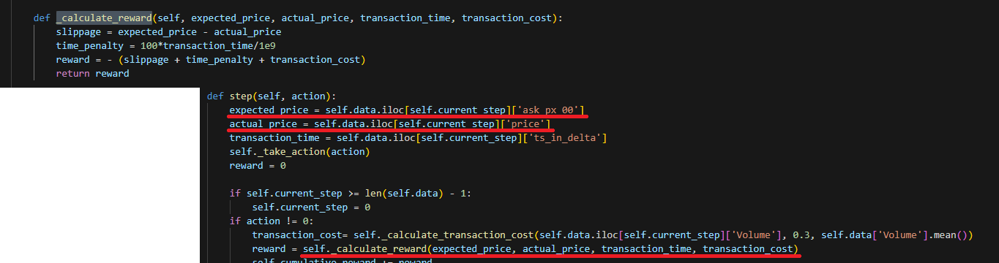

In a word, slippage value is the difference between the ask price(`ask_px_00`) and the current price(`price`). I calculated all differences between these 2 values for each rows. The result is following:

In [17]:
train_ask_prof = ((train_data['price'] - train_data['ask_px_00']) > 0)
print(f'There are {sum(train_ask_prof)} training data that the current price is bigger than ask price. The total number of training data is {train_size}.')

val_ask_prof = ((val_data['price'] - val_data['ask_px_00']) > 0)
print(f'There are {sum(val_ask_prof)} validation data that the current price is bigger than ask price. The total number of validation data is {val_size}.')

test_ask_prof = ((test_data['price'] - test_data['ask_px_00']) > 0)
print(f'There are {sum(test_ask_prof)} validation data that the current price is bigger than ask price. The total number of validation data is {test_size}.')

There are 0 training data that the current price is bigger than ask price. The total number of training data is 41489.
There are 0 validation data that the current price is bigger than ask price. The total number of validation data is 8890.
There are 0 validation data that the current price is bigger than ask price. The total number of validation data is 8892.


As you can see above output, slippage value is always positive value. Also, transaction cost and transaction time is also positive number. So the reward value of this environment is always non-positive number. This means that the optimal action to maximize the reward value is hold because the reward value is 0 for this action.

So to make our agent more relilable, we need to change the reward function.

In [114]:
import gymnasium as gym
import pandas as pd
import numpy as np
from gymnasium import spaces
import torch
import torch.nn as nn

class TradingEnvironment(gym.Env):
    metadata = {'render.modes': ['human']}

    def __init__(self, data, daily_trading_limit, sequence_length = 10):
        super(TradingEnvironment, self).__init__()
        self.data = data
        self.daily_trading_limit = daily_trading_limit
        self.current_step = 0
        self.sequence_length = sequence_length
        # Extract state columns
        self.state_columns = [col for col in data.columns if col not in ['price', 'size', 'sequence', 'bid_px_00', 'ask_px_00', 'bid_sz_00',
                                                                         'ask_sz_00', 'bid_ct_00', 'ask_ct_00', 'ts_in_delta', 'Volume_for_Reward',
                                                                         'Close_for_Reward', 'High', 'Low', 'Open', 'ATR_2', 'ATR_5', 'ATR_10',
                                                                         'ATR_20', 'DLR', 'TWAP', 'VWAP', 'ts_recv', 'ts_event', 'symbol', 'recv_hour_0',
                                                                         'recv_hour_1', 'recv_hour_2', 'recv_hour_3', 'recv_hour_4', 'recv_hour_5', 'recv_hour_6',
                                                                         'recv_hour_7', 'recv_hour_8', 'recv_hour_9', 'recv_hour_10', 'recv_hour_11', 'recv_hour_12',
                                                                         'recv_hour_13', 'recv_hour_14', 'recv_hour_15', 'recv_hour_16', 'recv_hour_17', 'recv_hour_18',
                                                                         'recv_hour_19', 'recv_hour_20', 'recv_hour_21', 'recv_hour_22', 'recv_hour_23', 'event_hour_0',
                                                                         'event_hour_1', 'event_hour_2', 'event_hour_3', 'event_hour_4', 'event_hour_5', 'event_hour_6',
                                                                         'event_hour_7', 'event_hour_8', 'event_hour_9', 'event_hour_10', 'event_hour_11', 'event_hour_12',
                                                                         'event_hour_13', 'event_hour_14', 'event_hour_15', 'event_hour_16', 'event_hour_17', 'event_hour_18',
                                                                         'event_hour_19', 'event_hour_20', 'event_hour_21', 'event_hour_22', 'event_hour_23', 'side_A', 'side_B',
                                                                         'side_N', 'flags_0.0', 'flags_128.0', 'flags_130.0']
                                ]
        # Initialize balance, shares held, and total shares traded
        self.total_balance = 10_000_000.0  # $10 million
        self.shares_held = 0
        self.total_shares_traded = 0
        # Define action space: [Hold, Buy, Sell]
        self.action_space = spaces.Discrete(3)

        # Define observation space based on state columns
        self.observation_space = spaces.Box(
            low=-np.inf, high=np.inf, shape=(self.sequence_length, len(self.state_columns)), dtype=np.float32
        )

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.current_step = self.sequence_length
        self.balance = 10_000_000.0  # $10 million
        self.shares_held = 0
        self.total_shares_traded = 0
        self.cumulative_reward = 0
        self.trades = []
        return self._next_observation(), {}

    def _next_observation(self):
        return self.data[self.state_columns].iloc[self.current_step-self.sequence_length:self.current_step].values

    def step(self, action):
        previous_portfolio_value = self.balance + self.shares_held * self.data.iloc[self.current_step - 1]['Close_for_Reward']
        actual_price = self.data.iloc[self.current_step]['price']
        transaction_time = self.data.iloc[self.current_step]['ts_in_delta']
        transaction_cost = self._take_action(action)

        current_portfolio_value = self.balance + self.shares_held * self.data.iloc[self.current_step]['Close_for_Reward']
        reward = current_portfolio_value - previous_portfolio_value

        done = self.current_step >= len(self.data) - 1

        if action != 0:
            time_penalty = 100 * transaction_time / 1e9
            reward -= time_penalty
            self.cumulative_reward += reward
            if self.trades:
                self.trades[-1]['reward'] = reward
                self.trades[-1]['transaction_cost'] = transaction_cost
                self.trades[-1]['time_penalty'] = time_penalty
                self.trades[-1]['portfolio_value'] = current_portfolio_value

        obs = self._next_observation()
        info = {
            'step': self.current_step,
            'action': action,
            'price': actual_price,
            'shares': self.trades[-1]['shares'] if self.trades else 0,
            'reward': reward,
            'portfolio_value': current_portfolio_value,
            'trades': self.trades[-1] if self.trades else None
        }

        self.current_step += 1

        if action in [1, 2]:
            print(f"Step: {info['step']}, Timestamp: {self.data.iloc[self.current_step]['ts_event']}, Action: {info['action']}, Price: {info['price']}, Shares: {info['shares']}, Reward: {reward}, Transaction Cost: {transaction_cost}, Time Penalty: {time_penalty}, Portfolio Value: {current_portfolio_value}")

        return obs, reward, done, False, info

    def _take_action(self, action):
        current_price = self.data.iloc[self.current_step]['Close_for_Reward']
        current_time = pd.to_datetime(self.data.iloc[self.current_step]['ts_event'])
        trade_info = {'step': self.current_step, 'timestamp': current_time, 'action': action, 'price': current_price, 'shares': 0, 'reward': 0, 'transaction_cost': 0, 'portfolio_value': 0, 'time_penalty': 0}

        transaction_cost = 0

        if action == 1: # and self.total_shares_traded < self.daily_trading_limit:  # Buy
            transaction_cost = self._calculate_transaction_cost(self.data.iloc[self.current_step]['Volume_for_Reward'], 0.3, self.data['Volume_for_Reward'].mean())
            shares_bought = max((self.balance * np.random.uniform(0.001, 0.005) - transaction_cost) // current_price, 0)
            if shares_bought == 0:
                transaction_cost = 0
            self.balance -= (shares_bought * current_price + transaction_cost)
            self.shares_held += shares_bought
            self.total_shares_traded += shares_bought
            trade_info['shares'] = shares_bought
            if(shares_bought>0):
                self.trades.append(trade_info)
        elif action == 2: # and self.total_shares_traded < self.daily_trading_limit:  # Sell
            transaction_cost = self._calculate_transaction_cost(self.data.iloc[self.current_step]['Volume_for_Reward'], 0.3, self.data['Volume_for_Reward'].mean())
            shares_sold = min((self.balance * np.random.uniform(0.001, 0.005) + transaction_cost) // current_price, self.shares_held)
            if shares_sold == 0:
                transaction_cost = 0
            self.balance += (shares_sold * current_price - transaction_cost)
            self.shares_held -= shares_sold
            self.total_shares_traded += shares_sold
            trade_info['shares'] = shares_sold
            if(shares_sold>0):
                self.trades.append(trade_info)

        return transaction_cost

    def _calculate_transaction_cost(self, volume, volatility, daily_volume):
        return volatility * np.sqrt(volume / daily_volume)

    def run(self):
        self.reset()
        for _ in range(len(self.data)):
            action = self.action_space.sample()
            self.step(action)
        return self.cumulative_reward, self.trades

    def render(self, mode='human', close=False):
        print(f'Step: {self.current_step}')
        print(f'Balance: {self.balance}')
        print(f'Shares held: {self.shares_held}')
        print(f'Total shares traded: {self.total_shares_traded}')
        print(f'Total portfolio value: {self.balance + self.shares_held * self.data.iloc[self.current_step]["Close_for_Reward"]}')
        print(f'Cumulative reward: {self.cumulative_reward}')
        self.print_trades()

    def print_trades(self):
        # download all trades in a pandas dataframe using .csv
        trades_df = pd.DataFrame(self.trades)
        # Save a csv
        trades_df.to_csv('trades_ppo.csv', index=False)
        for trade in self.trades:
            print(f"Step: {trade['step']}, Timestamp: {trade['timestamp']}, Action: {trade['action']}, Price: {trade['price']}, Shares: {trade['shares']}, Reward: {trade['reward']}, Transaction Cost: {trade['transaction_cost']}, Time Penalty: {trade['time_penalty']}, Portfolio Value: {trade['portfolio_value']}")

So, I updated the original environment class as above.
I ran this environment with random action to check whether it's working well as following.

In [19]:
daily_trading_limit = 1000
env = TradingEnvironment(train_data, daily_trading_limit, sequence_length=10)
initial_state = env.reset()
print('Initial State: ', initial_state)

for _ in range(10):
    action = env.action_space.sample()
    next_state, reward, done, truncated, info = env.step(action)
    print(f"Action: {action}, Reward: {reward}, Done: {done}, Info: {info}")
    if done:
        break

env.render()
cumulative_reward, trades = env.run()
print("Cumulative Reward: ", cumulative_reward)
print("Trades: ", trades)

Streaming output truncated to the last 5000 lines.
Step: 34019, Timestamp: 2023-07-03 14:48:09.727083542, Action: 2, Price: 191.85, Shares: 117.0, Reward: -0.3078643856326342, Transaction Cost: 0.2914258853974545, Time Penalty: 0.0164385, Portfolio Value: 9975266.23529936
Step: 34020, Timestamp: 2023-07-03 14:48:10.276765091, Action: 2, Price: 191.84, Shares: 85.0, Reward: -82.30813638563264, Transaction Cost: 0.2914258853974545, Time Penalty: 0.0167105, Portfolio Value: 9975183.943873474
Step: 34023, Timestamp: 2023-07-03 14:48:10.277034428, Action: 2, Price: 191.84, Shares: 203.0, Reward: -0.23262232054123877, Transaction Cost: 0.21612722103851162, Time Penalty: 0.0164951, Portfolio Value: 9975183.727746254
Step: 34024, Timestamp: 2023-07-03 14:48:10.396919625, Action: 1, Price: 191.84, Shares: 82.0, Reward: -0.3078837856326342, Transaction Cost: 0.2914258853974545, Time Penalty: 0.0164579, Portfolio Value: 9975183.436320368
Step: 34025, Timestamp: 2023-07-03 14:48:10.396919625, Acti

Also, there was another problem in the original environment. RL environment needs to return done = True when it reaches the final data in the dataset in `step()` function. But in the original script, it doesn't return done = True when it reaches the final data in the dataset. Instead of this process, it reset the current_step as the first data in the dataset. You can see about this from following image.

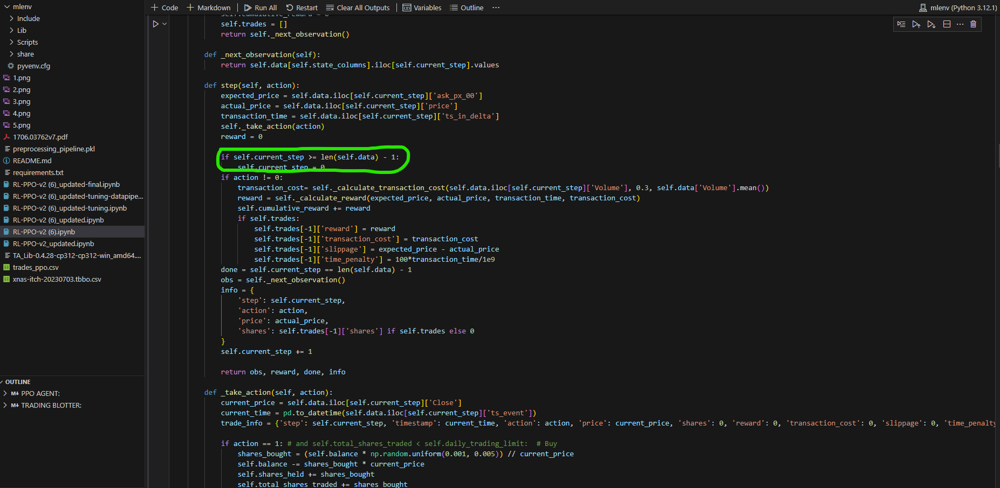

We already define the `reset()` function in the environment, we don't need to set the current_step set the first data in the dataset. It's enough to set `done = True`. So I updated this part as following:

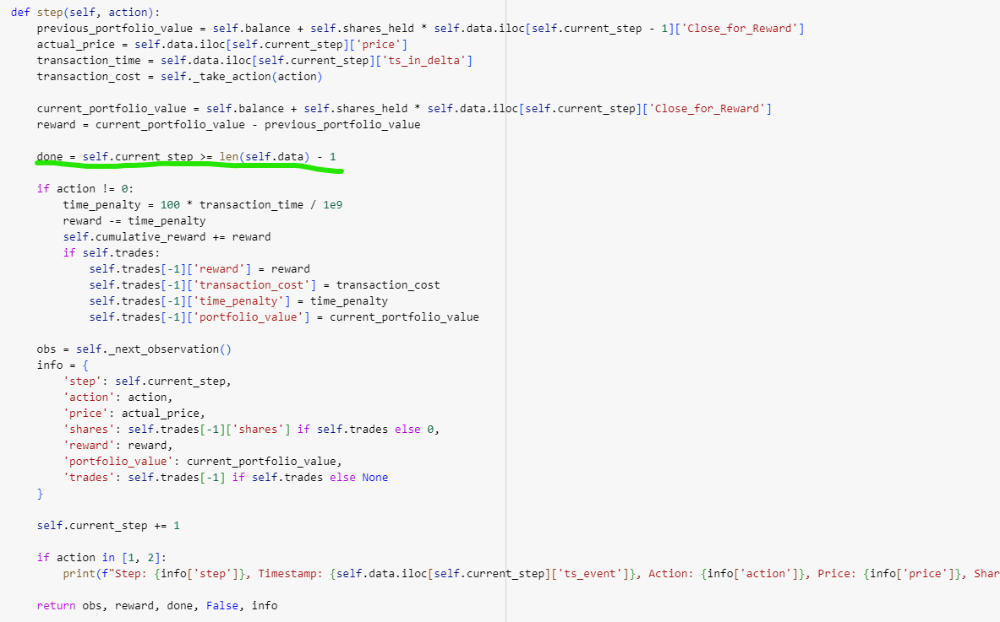

***Because of this confusion, model performance measure step in training process was fallen into the infinite loop because the `step()` function runs infinitely(This is my new experience).***

### **2) Model Implementation**

**All the contents of this section are my own in this project.**

#### **(1) Construct my transformer model**

I am going to start this part with the model construction. As I mentioned before, I constructed the model using transformer. Truth be told, transformer is more effective for sequential data than traditional RNNs and LSTMs because it allows to process entire sequences in parallel and capture long-range dependencies and relationships more effectively.

You can see my model's architecture from the following image.

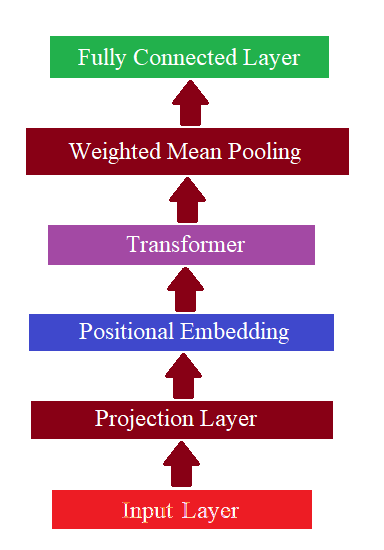

Let's explain about this model step by step.


*   **Projection Layer**: This layer project the input data into high-dimensional space to get more representations of the data and map to the distinct dimensions for transformer.
*   **Positional Embedding**: This layer is for providing the position information of the sequence. The reason why I use this layer before transformer is to overcome the disadvantage of the transformer. In fact, transformer has no inherent way of knowing the order of the sequence elements because the input sequences are processed as a whole rather than element by element.
*   **Transformer**: The output of the transformer is the corresponding encoded version of the input sequence of the layer.
*   **Weighted Mean Pooling**: This layer outputs the sum of the elements of the encoded sequence with the weights that are adaptive for the element position. Weight of the element with bigger index is bigger than the others.
*   **Fully connected Layer**: This is the last layer of this model. This layer is linear layer with relu activation function.



In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from stable_baselines3.common.torch_layers import BaseFeaturesExtractor
from gymnasium import spaces

class TransformerModel(BaseFeaturesExtractor):
    def __init__(self, observation_space: spaces.Box, d_model=128, nhead=4, num_encoder_layers=2, num_decoder_layers=2, dim_feedforward=512, dropout=0.1):
        super(TransformerModel, self).__init__(observation_space, features_dim=d_model)

        assert isinstance(observation_space, spaces.Box)
        assert len(observation_space.shape) == 2

        self.d_model = d_model
        self.input_projection = nn.Linear(observation_space.shape[1], d_model)
        self.transformer = nn.Transformer(d_model, nhead, num_encoder_layers, num_decoder_layers, dim_feedforward, dropout, batch_first=True)
        self.fc = nn.Linear(d_model, d_model)

    def forward(self, x):
        print(f"Input shape: {x.shape}")
        x = self.input_projection(x)
        print(f"Projected input shape: {x.shape}")
        if x.size(2) != self.d_model:
            raise ValueError(f"Expected input dimension {self.d_model}, but got {x.size(2)}")
        pos_encoding = self._generate_positional_encoding(x.size(1), self.d_model).to(x.device)
        x = x + pos_encoding
        x = self.transformer(x, x)
        weights = self._generate_exponential_weights(x.size(1)).to(x.device)
        x = torch.sum(x * weights, dim=1)
        x = F.relu(self.fc(x))
        return x

    def _generate_positional_encoding(self, seq_len, d_model):
        position = torch.arange(0, seq_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-torch.log(torch.tensor(10000.0)) / d_model))
        pos_encoding = torch.zeros(seq_len, d_model)
        pos_encoding[:, 0::2] = torch.sin(position * div_term)
        pos_encoding[:, 1::2] = torch.cos(position * div_term)
        return pos_encoding.unsqueeze(0)

    def _generate_exponential_weights(self, seq_len, decay_rate=0.9):
        weights = torch.tensor([(decay_rate ** i) for i in range(seq_len)], dtype=torch.float)
        weights = weights / weights.sum()
        weights = weights.unsqueeze(0).unsqueeze(2)
        return weights

#### **(2) Integrate my model into PPO algorithm using stable_baselines3 module**

This project is used PPO algorithm for reinforcement learning. To integrate our model to this algorithm, we can use our model's output as a feature extractor. So, I customized the policy class of PPO as following:

In [23]:
from stable_baselines3.common.policies import ActorCriticPolicy
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env

# Create a custom policy that uses the transformer model
class CustomPolicy(ActorCriticPolicy):
    def __init__(self, *args, **kwargs):
        super(CustomPolicy, self).__init__(*args, **kwargs, features_extractor_class=TransformerModel)

#### **(3) Fine-tuning the parameters associated with model's architecture and learning**

Before start the main part, we need to determine the metrics to determine which model is better. Truth be told, we can't say one model is better than the other one without any metrics. This might be minor, but it holds significant importance.

Following function calculates the `Cumulative Reward`, `Profit and Loss (P&L)`, `Sharpe Ratio`, `Sortino Ratio`, `Maximum Drawdown`, `Win Rate` and `Average Trade Return` for metrics.

In [65]:
def calculate_metrics(trades, initial_balance=10000000):
    # Convert trades to DataFrame
    trades_df = pd.DataFrame(trades)
    # Calculate portfolio value over time
    trades_df['portfolio_value'] = trades_df['price'] * trades_df['shares']
    trades_df['portfolio_value_cum'] = trades_df['portfolio_value'].cumsum() + initial_balance

    # Calculate returns
    trades_df['returns'] = trades_df['portfolio_value_cum'].pct_change().fillna(0)

    # Calculate cumulative reward
    cumulative_reward = trades_df['reward'].sum()

    # Calculate profit and loss (P&L)
    final_portfolio_value = trades_df['portfolio_value_cum'].iloc[-1]
    profit_and_loss = final_portfolio_value - initial_balance

    # Calculate Sharpe Ratio
    mean_return = trades_df['returns'].mean()
    std_return = trades_df['returns'].std()
    sharpe_ratio = mean_return / std_return if std_return != 0 else 0

    # Calculate Sortino Ratio
    downside_deviation = trades_df[trades_df['returns'] < 0]['returns'].std()
    sortino_ratio = mean_return / downside_deviation if downside_deviation != 0 else 0

    # Calculate Maximum Drawdown
    rolling_max = trades_df['portfolio_value_cum'].cummax()
    drawdown = rolling_max - trades_df['portfolio_value_cum']
    max_drawdown = drawdown.max()

    # Calculate Win Rate
    win_rate = len(trades_df[trades_df['reward'] > 0]) / len(trades_df)

    # Calculate Average Trade Return
    average_trade_return = trades_df['returns'].mean()

    metrics = {
        'Cumulative Reward': cumulative_reward,
        'Profit and Loss (P&L)': profit_and_loss,
        'Sharpe Ratio': sharpe_ratio,
        'Sortino Ratio': sortino_ratio,
        'Maximum Drawdown': max_drawdown,
        'Win Rate': win_rate,
        'Average Trade Return': average_trade_return
    }

    return metrics

Then, let's start training model with fine-tuning. At first, I wrote a `run_env` function to integrate our model to our environment.

In [73]:
def run_env(env, model):
    obs = env.reset()
    cumulative_reward = 0
    trades = []
    done = False
    while not done:
    # for i in range(20000):
        action, _ = model.predict(obs)
        obs, reward, done, info = env.step(action)
        cumulative_reward += reward
        trades.append(info)
    return cumulative_reward, trades

I am going to use random search algorithm for parameter tuning. As a parameter, I chose `learning_rate`, `n_steps`, `batch_size`, `n_epochs` for training and `d_model`, `n_head`, `num_encoder_layer`, `num_decode_layers`, `dim_feedforward`, `dropout` for transformer architecture.

Truth be told, I wanna use grid search for this process but because of the lack of the time, I used random search with 10 parameter samples. So, this search operation is worked only 10 times.

In [26]:
from sklearn.model_selection import ParameterSampler
param_grid = {
    'learning_rate': [3e-4, 1e-4, 5e-5],
    'n_steps': [2048, 1024, 512],
    'batch_size': [64, 128, 256],
    'n_epochs': [3, 5, 10],
    'd_model': [64, 128, 256],
    'nhead': [2, 4, 8],
    'num_encoder_layers': [2, 4, 6],
    'num_decoder_layers': [2, 4, 6],
    'dim_feedforward': [128, 512, 1024],
    'dropout': [0.1, 0.2, 0.3]
}
n_samples = 10
random_params = list(ParameterSampler(param_grid, n_iter=n_samples, random_state=42))

Also, I integrated early stopping and learning rate scheduling for this training.


*   **early stopping**: In this process, I set the maximum number of epochs without improvement before stopping the training as 5.
*   **learning rate scheduling**: In this process, learning rate is dynamically reduced by the factor 0.1 when the training metric doesn't improve for 3 consecutive epochs.

And I chose the `cumulative reward` value to measure the model's performance in this process.

In [28]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

best_training_reward = float('-inf')
best_params = None
max_no_improvement_epochs = 5

total_timesteps = 40000
epochs = 10

for params in random_params:
    train_env = TradingEnvironment(data=train_data, daily_trading_limit=10000, sequence_length=10)
    train_env = make_vec_env(lambda: train_env, n_envs=1)
    model = PPO(CustomPolicy, train_env,
                learning_rate=params['learning_rate'],
                n_steps=params['n_steps'],
                batch_size=params['batch_size'],
                n_epochs=params['n_epochs'],
                policy_kwargs={
                    'features_extractor_kwargs': {
                        'd_model': params['d_model'],
                        'nhead': params['nhead'],
                        'num_encoder_layers': params['num_encoder_layers'],
                        'num_decoder_layers': params['num_decoder_layers'],
                        'dim_feedforward': params['dim_feedforward'],
                        'dropout': params['dropout']
                    }
                },
                verbose=1)
    optimizer = model.policy.optimizer
    scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3)
    best_training_metric = float('-inf')
    no_improvement_count = 0

    for epoch in range(1, epochs + 1):
        model.learn(total_timesteps=total_timesteps)

        train_reward, train_trades = run_env(train_env, model)
        metrics = calculate_metrics(train_trades)
        current_training_metric = metrics['Cumulative Reward']

        if current_training_metric > best_training_metric:
            best_training_metric = current_training_metric
            no_improvement_count = 0
        else:
            no_improvement_count += 1

        scheduler.step(current_training_metric)

        print(f"Epoch {epoch}, Training Metric: {current_training_metric}, "
                f"Best Training Metric: {best_training_metric}, "
                f"Learning Rate: {scheduler.get_last_lr()[0]}")

        if no_improvement_count >= max_no_improvement_epochs:
            print(f"Early stopping at epoch {epoch} due to no improvement in training metric.")
            break

    if best_training_metric > best_training_reward:
        best_training_reward = best_training_metric
        best_params = params

print(f"Best Hyperparameters: {best_params}")

Streaming output truncated to the last 5000 lines.
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 256])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 256])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 256])
Step: 24788, Timestamp: 2023-07-03 14:20:08.789153837, Action: 2, Price: 192.97, Shares: 4.0, Reward: -0.19436464525134564, Transaction Cost: 0.17726744560546193, Time Penalty: 0.0170972, Portfolio Value: 9847611.773289965
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 256])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 256])
Step: 24790, Timestamp: 2023-07-03 14:20:08.793712377, Action: 1, Price: 192.98, Shares: 4.0, Reward: 491.4931836107289, Transaction Cost: 0.02914258853974545, Time Penalty: 0.0176738, Portfolio Value: 9848103.284147376
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 25

KeyboardInterrupt: 

***Because this tuning process takes too much time(I already lost 104 compute units in Google Colab Service but this process is not finished), I stopped this process and used the sub-optimzed parameter until now.***

In [33]:
print(best_params)

{'num_encoder_layers': 6, 'num_decoder_layers': 4, 'nhead': 8, 'n_steps': 1024, 'n_epochs': 5, 'learning_rate': 0.0003, 'dropout': 0.2, 'dim_feedforward': 128, 'd_model': 64, 'batch_size': 64}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### **(4) Train the model using fine-tuned parameter**

Let's train the model with best parameters from the above process. After this process, we will get final agent of this project.

In [71]:
epochs = 3
total_timesteps = 20000
max_no_improvement_epochs = 2
best_training_reward = float('-inf')

train_env = TradingEnvironment(data=real_train_data_transformed, daily_trading_limit=10000, sequence_length=10)
train_env = make_vec_env(lambda: train_env, n_envs=1)
model = PPO(CustomPolicy, train_env,
            learning_rate=best_params['learning_rate'],
            n_steps=best_params['n_steps'],
            batch_size=best_params['batch_size'],
            n_epochs=best_params['n_epochs'],
            policy_kwargs={
                'features_extractor_kwargs': {
                    'd_model': best_params['d_model'],
                    'nhead': best_params['nhead'],
                    'num_encoder_layers': best_params['num_encoder_layers'],
                    'num_decoder_layers': best_params['num_decoder_layers'],
                    'dim_feedforward': best_params['dim_feedforward'],
                    'dropout': best_params['dropout']
                }
            },
            verbose=1)
optimizer = model.policy.optimizer
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3)
best_training_metric = float('-inf')
no_improvement_count = 0

for epoch in range(1, epochs + 1):
    model.learn(total_timesteps=total_timesteps)

    train_reward, train_trades = run_env(train_env, model)
    flat_trades = [trade for sublist in train_trades for trade in sublist]
    metrics = calculate_metrics(flat_trades)
    current_training_metric = metrics['Cumulative Reward']

    if current_training_metric > best_training_metric:
        best_training_metric = current_training_metric
        no_improvement_count = 0
        model.save('/content/rl_final_epoch')
    else:
        no_improvement_count += 1

    scheduler.step(current_training_metric)

    print(f"Epoch {epoch}, Training Metric: {current_training_metric}, "
            f"Best Training Metric: {best_training_metric}, "
            f"Learning Rate: {scheduler.get_last_lr()[0]}")

    if no_improvement_count >= max_no_improvement_epochs:
        print(f"Early stopping at epoch {epoch} due to no improvement in training metric.")
        break

Streaming output truncated to the last 5000 lines.
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Step: 17668, Timestamp: 2023-07-03 13:55:44.595948848, Action: 1, Price: 192.92, Shares: 181.0, Reward: -0.2973516605411291, Transaction Cost: 0.2805474596175394, Time Penalty: 0.0168042, Portfolio Value: 9999501.271707125
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input s

Because I don't have enough units in my google colab account, I didn't train the model enough. But I can update this part if you want.

In [69]:
train_reward, train_trades = run_env(train_env, model)
flat_trades = [trade for sublist in train_trades for trade in sublist]
metrics = calculate_metrics(flat_trades)
print(metrics)

Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Step: 11, Timestamp: 2023-07-03 08:00:30.451829005, Action: 1, Price: 194.0, Shares: 231.0, Reward: -1.6750911146910905, Transaction Cost: 1.6583934143536734, Time Penalty: 0.0166977, Portfolio Value: 9999998.341606585
{'Cumulative Reward': -1.6750911146910905, 'Profit and Loss (P&L)': 44814.0, 'Sharpe Ratio': 0.7071067811865476, 'Sortino Ratio': nan, 'Maximum Drawdown': 0.0, 'Win Rate': 0.0, 'Average Trade Return': 0.0022406999999999844}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## **5. Model Performance Evaluation**

Until now, I tried to prove the validity of my algorithm theoreotically. Someone told us "Talk is cheap, show me the result". I think this means that the practical outcomes are what matter most. So performance evaluation is one of the critical part of this script.

### **1) Evaluation Metrics**

Let's explain the metrics for model performance evaluation of this project in detail.


*   **`Cumulative Reward`**: This is the total sum of rewards obtained from all trade logs.
*   **`Profit and Loss(P&L)`**: This is difference between the final portfolio value and the initial balance.
*   **`Sharpe Ratio`**: This is the ratio of the average excess return over the risk-free rate to the standard deviation of the returns.
*   **`Sortino Ratio`**: This is the variation of the `Sharpe Ratio` that penalize only the negative returns instead of total volatility.
*   **`Maximum Drawdown(MDD)`**: This is the maximum value of the difference between cumulative maximum portfolio value and the current porfolio value at each time point.
*   **`Win Rate`**: This is the proportion of trades that resulted in a positive reward.
*   **`Average Trade Return`**: This is the mean value of the returns for each trade.


### **2) Performance Evaluation**

Before evaluating the agent's performance using above metrics, let's clarify the computer's performance first.

In [32]:
!nvidia-smi

Sun Aug 11 13:27:59 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0              50W / 400W |    967MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

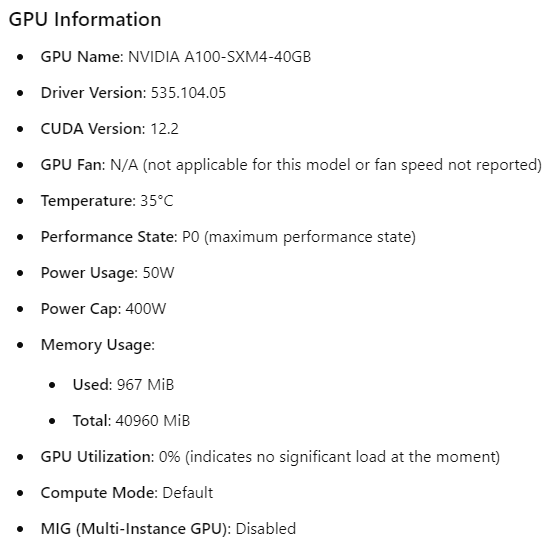

Then, let's start the evaluation in the test environment for several metrics.

In [115]:
test_env = TradingEnvironment(data=test_data_transformed, daily_trading_limit=10000, sequence_length=10)
test_env = make_vec_env(lambda: test_env, n_envs=1)
test_reward, test_trades = run_env(test_env, model)
flat_trades = [trade for sublist in test_trades for trade in sublist]
test_metrics = calculate_metrics(flat_trades)
print(f"Test Cumulative Reward: {test_reward}")
print("Test Performance Metrics:")
for metric, value in test_metrics.items():
    print(f"{metric}: {value}")

Streaming output truncated to the last 5000 lines.
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Input shape: torch.Size([1, 10, 17])
Projected input shape: torch.Size([1, 10, 64])
Step: 6562, Timestamp: 2023-07-03 16:58:46.818871729, Action: 2, Price: 192.53, Shares: 239.0, Reward: -0.128

<ipython-input-65-1854e6d590e1>:9: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  trades_df['returns'] = trades_df['portfolio_value_cum'].pct_change().fillna(0)


### **3) Comparison with Blotter agent**

Because we don't have any measured value of the blotter agent's performance in this dataset, we need to implement this agent in this script first. Luckily, there are some blotter agent codes in the original script. So, I will use this code to understand about this agent and get the performance value for our metrics.

#### **(1) How blotter agent works**

Blotter agent uses its own data pipeline. Let's start with this part.

In [83]:
import pandas as pd
import numpy as np
from scipy.stats import norm
import matplotlib.pyplot as plt

INITIAL_CASH = 10000000  # $10 million

def preprocess_data(df):
    df['liquidity'] = df['bid_sz_00'] * df['bid_px_00'] + df['ask_sz_00'] * df['ask_px_00']
    return df

def calculate_rsi(data, window=14):
    delta = data.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

def calculate_vol_and_liquidity(price_df, volume_df, window_size):
    # Calculate rolling statistics
    rolling_mean_vol = price_df.pct_change().rolling(window=window_size).mean()
    rolling_std_vol = price_df.pct_change().rolling(window=window_size).std()
    rolling_mean_liq = volume_df.rolling(window=window_size).mean()
    rolling_std_liq = volume_df.rolling(window=window_size).std()

    return rolling_mean_vol, rolling_std_vol, rolling_mean_liq, rolling_std_liq

def get_percentile(current_value, mean, std):
    if std > 0:
        z_score = (current_value - mean) / std
        percentile = norm.cdf(z_score)
    else:
        percentile = 0.5  # No variation
    return percentile

def get_trade_price(base_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction):
    vol_percentile = get_percentile(current_vol, mean_vol, std_vol)
    liq_percentile = get_percentile(current_liq, mean_liq, std_liq)

    # Define price adjustment scenarios based on market conditions
    if vol_percentile >= 0.9 and liq_percentile < 0.1:
        price_adjustment_percent = np.random.uniform(-0.25, -0.15)
    elif vol_percentile <= 0.1 and liq_percentile < 0.1:
        price_adjustment_percent = np.random.uniform(-0.10, -0.05)
    elif vol_percentile >= 0.9 and liq_percentile >= 0.9:
        price_adjustment_percent = np.random.uniform(-0.05, +0.10)
    else:
        price_adjustment_percent = np.random.uniform(-0.05, +0.05)  # Default for normal conditions

    # Adjust price based on trade direction
    if trade_direction == 'BUY':
        adjusted_price = base_price * (1 - price_adjustment_percent)
    else:  # SELL
        adjusted_price = base_price * (1 + price_adjustment_percent)

    return adjusted_price


Then let's continue to analyze how the blotter agent works. This agent focuses on the current RSI value. The agent decides to


*   **Buy** when the current RSI value is less than 30.
*   **Sell** when the current RSI value is bigger than 70.
*   **Hold** elsewhere.

Following cell shows the class of this agent.

In [84]:
class TradingEnvironmentwithBlotter:
    def __init__(self, data, daily_trading_limit, window_size):
        self.data = preprocess_data(data)
        self.daily_trading_limit = daily_trading_limit
        self.window_size = window_size
        self.state_columns = ['price', 'liquidity', 'RSI', 'MACD', 'MACD_signal', 'MACD_hist', 'Stoch_k', 'Stoch_d',
                              'OBV', 'Upper_BB', 'Middle_BB', 'Lower_BB', 'ATR_1', 'ADX', '+DI', '-DI', 'CCI']
        self.reset()

    def reset(self):
        self.current_step = 0
        self.balance = INITIAL_CASH
        self.shares_held = 0
        self.total_shares_traded = 0
        self.cumulative_reward = 0
        self.trades = []
        self.portfolio = {'cash': self.balance, 'holdings': {ticker: 0 for ticker in self.data['symbol'].unique()}}
        self.data['RSI'] = calculate_rsi(self.data['price'])
        self.data['pct_change'] = self.data['price'].pct_change()
        self.data['rolling_mean_vol'], self.data['rolling_std_vol'], self.data['rolling_mean_liq'], self.data['rolling_std_liq'] = calculate_vol_and_liquidity(self.data['price'], self.data['liquidity'], self.window_size)

    def step(self):
        row = self.data.iloc[self.current_step]
        current_price = row['price']
        current_time = pd.to_datetime(row['ts_event'])
        current_rsi = row['RSI']
        current_vol = row['pct_change']
        current_liq = row['liquidity']
        mean_vol = row['rolling_mean_vol']
        std_vol = row['rolling_std_vol']
        mean_liq = row['rolling_mean_liq']
        std_liq = row['rolling_std_liq']

        if current_rsi < 30:  # Entry signal based on RSI
            trade_direction = 'BUY'
            trade_price = get_trade_price(current_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction)
            trade_size = (self.portfolio['cash'] * np.random.uniform(0.001, 0.005)) / trade_price
            if self.portfolio['cash'] >= trade_size * trade_price:
                self.portfolio['cash'] -= trade_size * trade_price
                self.portfolio['holdings'][row['symbol']] += trade_size
                trade_status = 'filled'
            else:
                trade_status = 'cancelled'
        elif current_rsi > 70:  # Exit signal based on RSI
            trade_direction = 'SELL'
            if self.portfolio['holdings'][row['symbol']] > 0:
                trade_size = min(self.portfolio['holdings'][row['symbol']], self.portfolio['cash'] * np.random.uniform(0.001, 0.005) / current_price)
                trade_price = get_trade_price(current_price, current_vol, current_liq, mean_vol, std_vol, mean_liq, std_liq, trade_direction)
                self.portfolio['cash'] += trade_size * trade_price
                self.portfolio['holdings'][row['symbol']] -= trade_size
                trade_status = 'filled'
            else:
                trade_size = 0
                trade_status = 'cancelled'
        else:
            trade_direction = 'HOLD'
            trade_size = 0
            trade_price = current_price
            trade_status = 'skipped'

        if trade_size > 0:
            expected_price = row['ask_px_00']
            actual_price = row['price']
            transaction_time = row['ts_in_delta']
            transaction_cost = self._calculate_transaction_cost(row['Volume'], 0.3, self.data['Volume'].mean())
            slippage = expected_price - actual_price
            time_penalty = 1000 * transaction_time / 1e9
            reward = - (slippage + time_penalty + transaction_cost)

            self.cumulative_reward += reward
            total_portfolio_value = self.portfolio['cash'] + sum(self.portfolio['holdings'][symbol] * row['price'] for symbol in self.portfolio['holdings'])

            self.trades.append({
                'step': self.current_step,
                'timestamp': current_time,
                'action': trade_direction,
                'price': trade_price,
                'shares': trade_size,
                'symbol': row['symbol'],
                'reward': reward,
                'transaction_cost': transaction_cost,
                'slippage': slippage,
                'time_penalty': time_penalty,
                'total_portfolio_value': total_portfolio_value
            })

        self.current_step += 1
        if self.current_step >= len(self.data) - 1:
            done = True
            self.current_step = 0

    def _calculate_transaction_cost(self, volume, volatility, daily_volume):
        return volatility * np.sqrt(volume / daily_volume)

    def run(self):
        self.reset()
        for _ in range(len(self.data)):
            self.step()
        return self.cumulative_reward, self.trades

    def render(self):
        print(f'Cumulative reward: {self.cumulative_reward}')
        row = self.data.iloc[self.current_step]
        print(f'Total portfolio value: {self.portfolio["cash"] + self.portfolio["holdings"][row["symbol"]]*row["Close"]}')
        # get trades in a pandas dataframe
        trades_df = pd.DataFrame(self.trades)
        # Save a csv
        trades_df.to_csv('trades_blotter.csv', index=False)
        for trade in self.trades:
            print(f"Step: {trade['step']}, Timestamp: {trade['timestamp']}, Action: {trade['action']}, Price: {trade['price']}, Shares: {trade['shares']}, Symbol: {trade['symbol']}, Reward: {trade['reward']}, Transaction Cost: {trade['transaction_cost']}, Slippage: {trade['slippage']}, Time Penalty: {trade['time_penalty']}, Total Portfolio Value: {trade['total_portfolio_value']}")

Let's run the blotter agent and get the performance value of this agent.

In [85]:
# Filter data for the specified ticker
# ticker = 'AAPL'  # Specify the ticker you want to trade
# ticker_data = market_features_df[market_features_df['symbol'] == ticker]

window_size = 60
daily_trading_limit = 1000
# Create the trading environment
env = TradingEnvironmentwithBlotter(test_data_transformed, daily_trading_limit=1000, window_size=window_size)  # Daily trading limit of 1000 shares

# Run the environment
cumulative_reward, trades = env.run()

# Render the results
env.render()

<ipython-input-84-08d663a3b3a8>:19: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  self.data['pct_change'] = self.data['price'].pct_change()
<ipython-input-83-f1cc3dbb2d22>:22: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  rolling_mean_vol = price_df.pct_change().rolling(window=window_size).mean()
<ipython-input-83-f1cc3dbb2d22>:23: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  rolling_std_vol = price

Cumulative reward: nan
Total portfolio value: 6758198.248766743
Step: 22, Timestamp: 2023-07-03 16:34:45.597523360, Action: BUY, Price: 191.56691711693796, Shares: 259.2086219456008, Symbol: AAPL, Reward: nan, Transaction Cost: nan, Slippage: 0.005000000000023874, Time Penalty: 0.166653, Total Portfolio Value: 10000123.923205296
Step: 23, Timestamp: 2023-07-03 16:34:45.597523360, Action: BUY, Price: 194.30038491513412, Shares: 240.80312482719816, Symbol: AAPL, Reward: nan, Transaction Cost: nan, Slippage: 0.005000000000023874, Time Penalty: 0.166653, Total Portfolio Value: 9999580.819470044
Step: 26, Timestamp: 2023-07-03 16:34:49.671770584, Action: BUY, Price: 183.186442402772, Shares: 209.97907696929357, Symbol: AAPL, Reward: nan, Transaction Cost: nan, Slippage: 0.010000000000019327, Time Penalty: 0.182766, Total Portfolio Value: 10001437.381263468
Step: 27, Timestamp: 2023-07-03 16:34:49.671770584, Action: BUY, Price: 185.77886806522142, Shares: 174.62960821147837, Symbol: AAPL, Re

In [92]:
# test_metrics = calculate_metrics(trades)
print("Test Performance Metrics:")
for metric, value in test_metrics.items():
    print(f"{metric}: {value}")

Test Performance Metrics:
Cumulative Reward: -277.1988587256357
Profit and Loss (P&L): -162867
Sharpe Ratio: 0.9477864777212552
Sortino Ratio: nan
Maximum Drawdown: 0.0
Win Rate: 0.0
Average Trade Return: 0.0005256734493306157


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


#### **(2) Performance Comparison between Blotter agent and Our agent**

The performance table of these two agents in the test data is following:

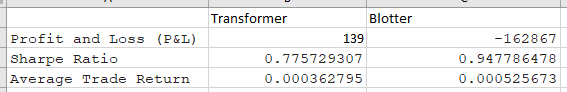

## **6. Conclusion**

During this process, I


*   constructed whole pipeline of bot model development of stock trading
*   learned how to integrate the transformer model to reinforcement learning
*   learned that it's more safe and profitable to start with more initial balance.

I know my agent's performance isn't high but there are so many ways to update this model.

Let me show about this here.


*   **Data Collection**: Truth be told, it's non-representative dataset for this problem. It's the data for only one day. In trading, there are periodic personalities. So, the model's performance improves a lot using this kind of features.
*   **Setup the trading fund range**: The reasons that the total portfolio decreases after transaction are two part - reduction of the share price, wrong decision. Because the limitation of the funding money, limited number of shares are transferred to the balance. So, if the the total share price reduction is bigger than the balance increasing price, the total portfolio value must be decreased.
*   **Data Collection & Reward Function**: We need to determine whether the penalty time is neccessary for reward calculation. I don't know what this value is clearly, but this value is effect the hold decision because it results the reward variable into negative value.
*   **Fine-Tuning**: In fact, there are more options for parameter tuning and more parameters than need to be fine-tuned(e.g. `sequence_length` in the environment). So, the performance will be improved to fine-tune all the parameters.
*   **Enough Training**: Because I don't have much time, I set the number of epochs and total_timesteps too small. Also, because the number of epoch is 3, so the learning rate scheduling isn't working now. Anyway, I checked this learning rate scheduling code is working in this project. If I consumed more time for training, the training performance will be increased a lot.

And there are more options to improve the model's performance. This is very interesting problem and I am sure that we can solve perfectly using transformer model and reinforcement learning.


**Thanks for giving me a chance to touch this problem and hope to see you again. I wanna discuss about this more detail with the professor to learn about this more and more.**